# <center> RL and Advanced DL: Домашнее задание 3

Третье домашнее задание посвящено порождающим моделям, а точнее — порождающим состязательным сетям. Это самое маленькое и самое техническое задание в курсе, но что уж поделать. Как обычно, в качестве решения ожидается ссылка на jupyter-ноутбук на вашем github (или публичный, или с доступом для snikolenko); ссылку обязательно нужно прислать в виде сданного домашнего задания на портале Академии. Любые комментарии, новые идеи и рассуждения на тему, как всегда, категорически приветствуются.

## Часть первая: перенос стиля при помощи pix2pix
В этом задании мы будем реализовывать перенос стиля на спаренных данных (paired data). Из стандартных датасетов я выбрал самый маленький -- давайте реализуем перенос стиля из масок сегментации в “настоящие фотографии” для конкретного случая фасадов домов:
<center><img src='../resource/homework-3/img-1.png'>

Датасет можно скачать [здесь](http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz) (и во многих других местах, должно быть ~29 мегабайт).

В первой части подразумевается реализация pix2pix архитектуры, т.е. генератора и дискриминатора, которые получают на вход условие в виде изображения исходного стиля (подробнее см. лекцию и собственно [Isola et al., 2016](https://arxiv.org/pdf/1611.07004.pdf)):
<center><img src='../resource/homework-3/img-2.png'>

In [1]:
import os
import time
from glob import glob
import random
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

import numpy as np
from tqdm import tqdm
import torch
import importlib
from torch.optim import lr_scheduler
import torchvision.transforms as transforms
from PIL import Image

import matplotlib.pyplot as plt

from models.pix2pix import Pix2Pix
from models.cycle_gan import CycleGAN

In [2]:
batch_size = 1
checkpoints = './checkpoints'
train_dir = '../resource/homework-3/facades/train/'
val_dir = '../resource/homework-3/facades/val/'

In [3]:
def tensor2img(input_image):
    if not isinstance(input_image, np.ndarray):
        if isinstance(input_image, torch.Tensor):  # get the data from a variable
            image_tensor = input_image.data
        else:
            return input_image
        image_numpy = image_tensor[0].cpu().float().numpy()  # convert it into a numpy array
        if image_numpy.shape[0] == 1:  # grayscale to RGB
            image_numpy = np.tile(image_numpy, (3, 1, 1))
        image_numpy = (np.transpose(image_numpy, (1, 2, 0)) + 1) / 2.0 * 255.0  # post-processing: tranpose and scaling
    else:  # if it is a numpy array, do nothing
        image_numpy = input_image
    return image_numpy.astype(np.uint8)

In [4]:
def plot_result(visuals):
    fig, axis = plt.subplots(3, 8, figsize=(16, 9))
    for i in range(8):
        axis[0][i].imshow(tensor2img(visuals[i]['real_A']))
        axis[0][i].axis('off')
        
        axis[1][i].imshow(tensor2img(visuals[i]['real_B']))
        axis[1][i].axis('off')
        
        axis[2][i].imshow(tensor2img(visuals[i]['fake_B']))
        axis[2][i].axis('off')
    plt.show()

In [5]:
class PairedDataset():

    def __init__(self, dataset_dir):
        self.dir_AB = dataset_dir  
        self.AB_paths = sorted(glob(self.dir_AB + '/*.jpg'))
        self.input_nc = 3
        self.output_nc = 3
        self.transforms = transforms.Compose([
            transforms.Resize([286, 286], Image.BICUBIC),
            transforms.RandomCrop(256),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ])
    def __getitem__(self, index):
        AB_path = self.AB_paths[index]
        AB = Image.open(AB_path).convert('RGB')
        w, h = AB.size
        w2 = int(w / 2)
        A = AB.crop((0, 0, w2, h))
        B = AB.crop((w2, 0, w, h))

        A = self.transforms(A)
        B = self.transforms(B)

        return {'A': A, 'B': B, 'A_paths': AB_path, 'B_paths': AB_path}

    def __len__(self):
        return len(self.AB_paths)

In [6]:
class FacadeDatasetDataLoader:

    def __init__(self, dataset, shuffle=False):
        self.dataset = dataset
        self.dataloader = torch.utils.data.DataLoader(
            self.dataset,
            batch_size=batch_size,
            shuffle=shuffle,
            num_workers=4
        )

    def load_data(self):
        return self

    def __len__(self):
        return len(self.dataset)

    def __iter__(self):
        for i, data in enumerate(self.dataloader):
            yield data

In [7]:
dataset_train = PairedDataset(train_dir)
dataloader_train = FacadeDatasetDataLoader(dataset_train, shuffle=False)
dataset_train = dataloader_train.load_data()

dataset_val = PairedDataset(val_dir)
dataloader_val = FacadeDatasetDataLoader(dataset_val, shuffle=False)
dataset_val = dataloader_val.load_data()

In [8]:
print('The number of training images = %d' % len(dataloader_train))

The number of training images = 400


In [9]:
params = {
    'phase': 'train',
    'lr': 0.001,
    'beta': 0.5
}
model = Pix2Pix('facades_pix2pix', params)
model.setup()
total_iters = 0

In [10]:
n_epochs = 200

Epoch [20/200] | Time: 32.11090898513794 | G_Loss:2.561882972717285 | D_Fake"0.0265036690980196


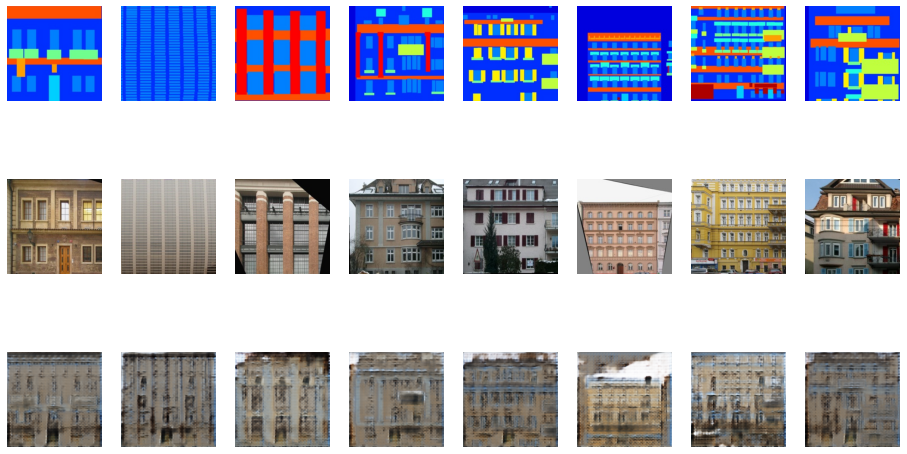

Epoch [40/200] | Time: 41.56117248535156 | G_Loss:2.4698948860168457 | D_Fake"0.035515498369932175


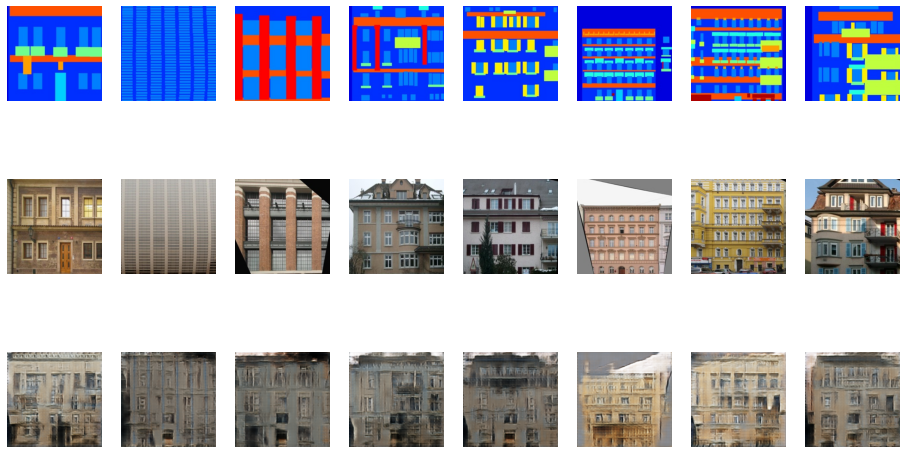

Epoch [60/200] | Time: 39.216201305389404 | G_Loss:3.8404340744018555 | D_Fake"0.029323197901248932


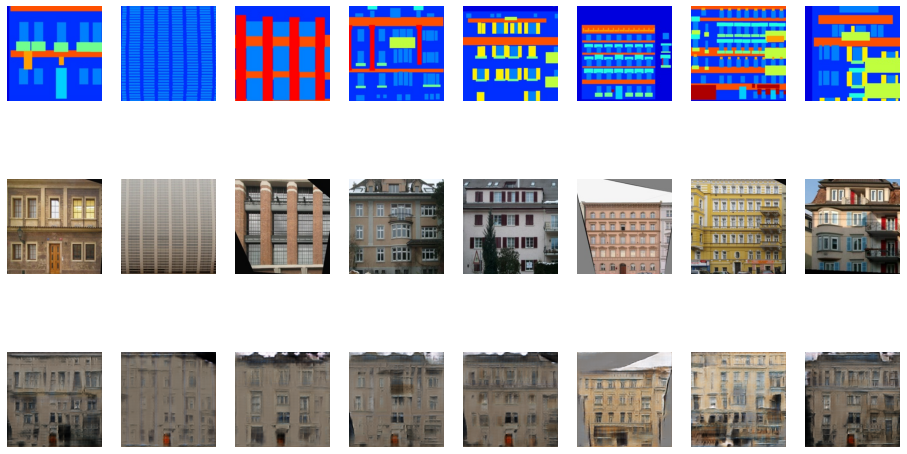

Epoch [80/200] | Time: 40.790812730789185 | G_Loss:3.649434804916382 | D_Fake"0.01246529258787632


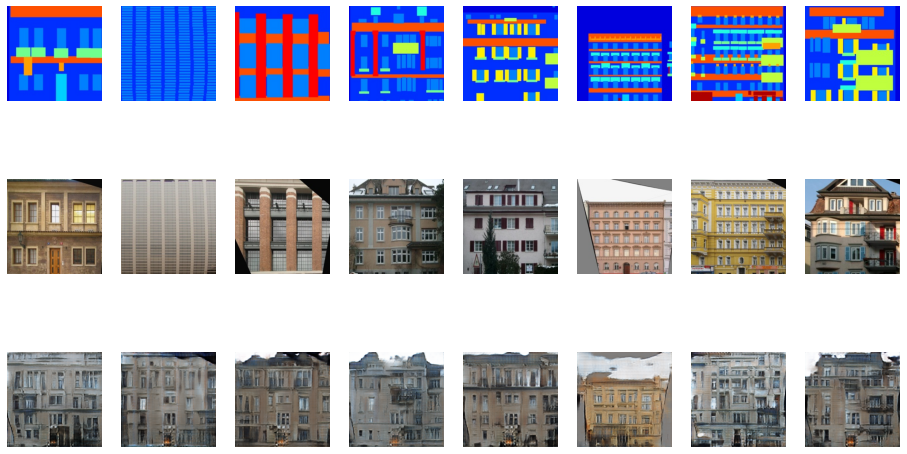

Epoch [100/200] | Time: 38.02922344207764 | G_Loss:3.6708035469055176 | D_Fake"0.03446458652615547


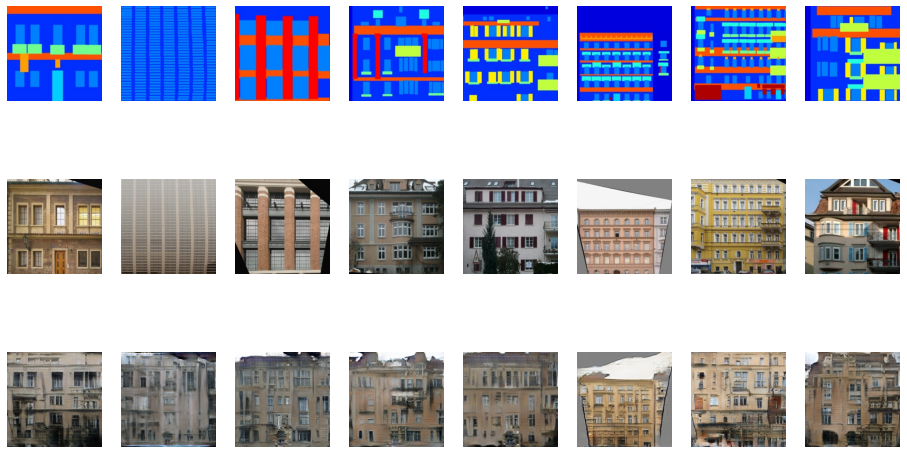

Epoch [120/200] | Time: 38.37884855270386 | G_Loss:4.917287349700928 | D_Fake"0.0037795109674334526


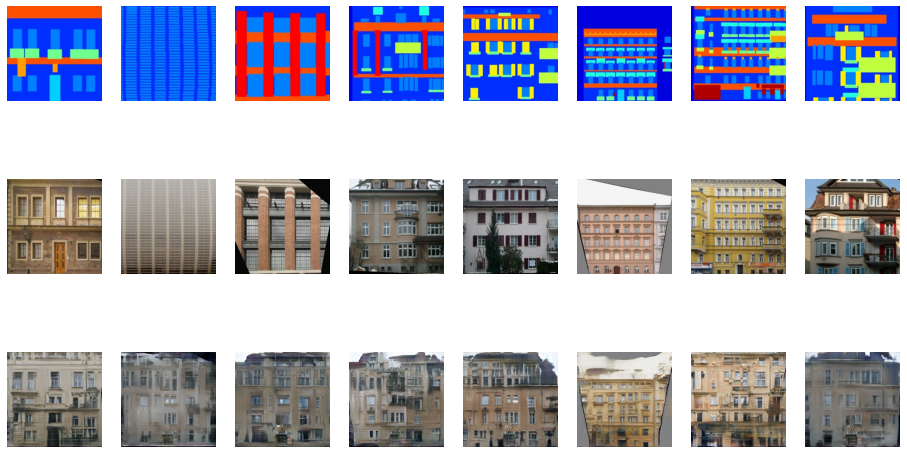

Epoch [140/200] | Time: 42.95097017288208 | G_Loss:5.6661882400512695 | D_Fake"0.006636442616581917


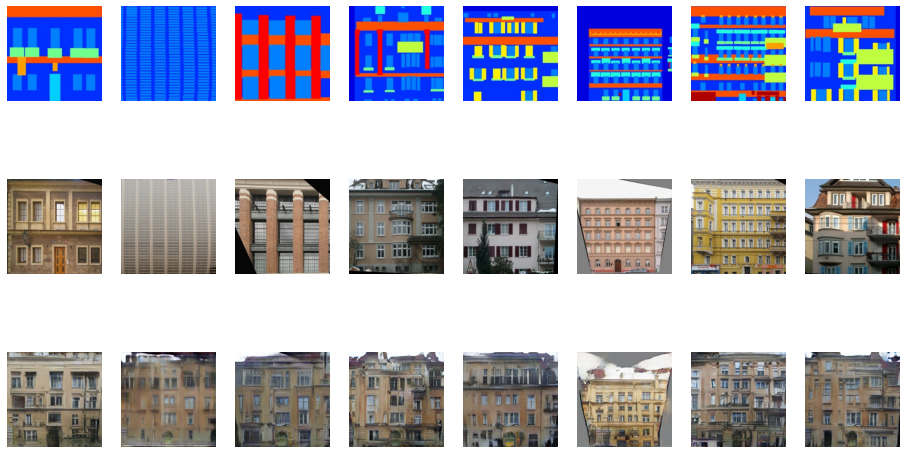

Epoch [160/200] | Time: 29.608845233917236 | G_Loss:4.945965766906738 | D_Fake"0.022219398990273476


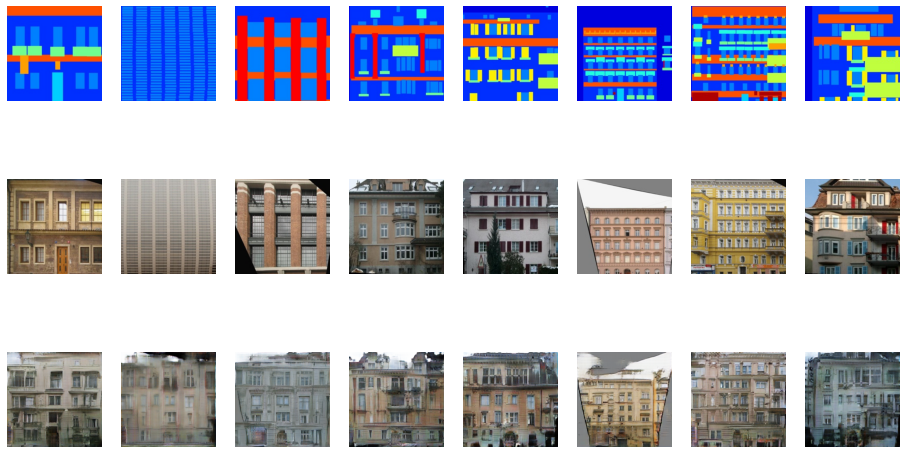

Epoch [180/200] | Time: 41.297821283340454 | G_Loss:5.264980792999268 | D_Fake"0.029314421117305756


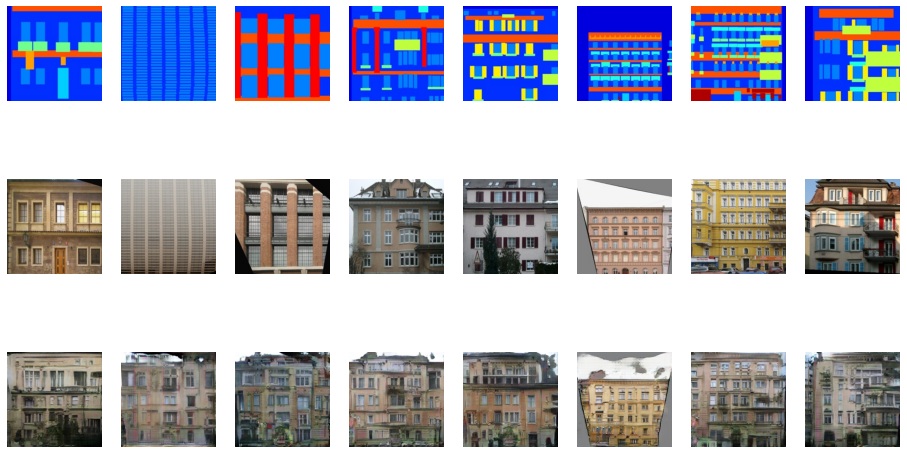

Epoch [200/200] | Time: 19.30630135536194 | G_Loss:6.100714683532715 | D_Fake"0.010516134090721607


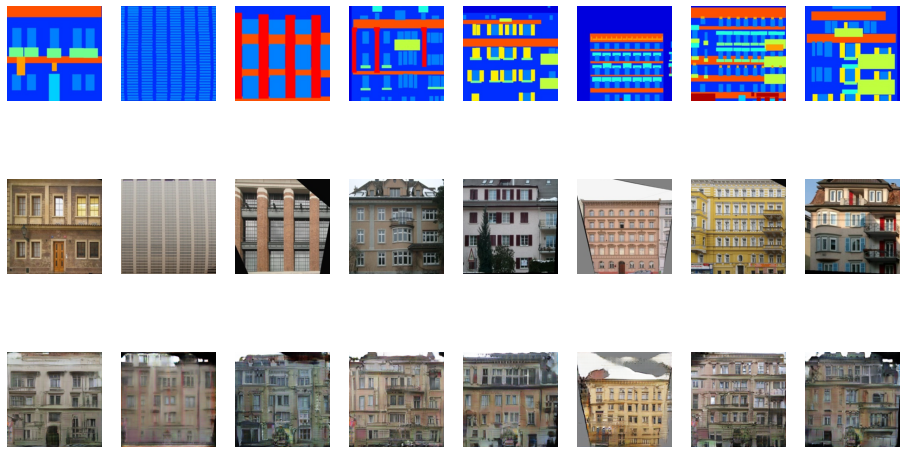

In [11]:
for epoch in range(1, n_epochs + 1):
    epoch_start_time = time.time()
    iter_data_time = time.time()
    epoch_iter = 0      
    model.update_learning_rate()    
    for i, data in enumerate(dataloader_train):
        iter_start_time = time.time()
        total_iters += batch_size
        epoch_iter += batch_size
        model.set_input(data)
        model.optimize_parameters()  

    if epoch % 20 == 0: 
        losses = model.get_current_losses()
        print('Epoch [{0}/{1}] | Time: {2} | G_Loss:{3} | D_Fake"{4}'.format(
            epoch, n_epochs, time.time() - epoch_start_time, losses['G_GAN'], losses['D_fake']
        ))
        visuals_list = []
        for i, data in enumerate(dataset_val):
            if i > 8:
                break
            model.set_input(data) 
            model.test()      
            visuals = model.get_current_visuals()
            img_path = model.get_image_paths() 
            visuals_list.append(visuals)
        plot_result(visuals_list)
    model.save_networks('latest')

# Часть вторая: добавим циклы

Вторая часть -- реализация CycleGAN. Предлагается на том же датасете реализовать базовую конструкцию CycleGAN для unpaired style transfer, то есть переноса стилей, каждый из которых задан неразмеченным датасетом (подробнее см. лекцию и собственно [Zhu et al., 2017](https://arxiv.org/pdf/1703.10593.pdf)):

In [125]:
class UnPairedDataset():

    def __init__(self, dataset_dir):
        paths = sorted(glob(dataset_dir + '/*.jpg'))
        random.shuffle(paths)
        index = random.randint(0, len(paths))
        self.A = paths[index:]
        self.B = paths[:index]
        self.input_nc = 3
        self.output_nc = 3
        self.transforms = transforms.Compose([
            transforms.Resize([286, 286], Image.BICUBIC),
            transforms.RandomCrop(256),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ])
    def __getitem__(self, index):
        A_path = self.A[index]
        B_path = self.B[index]
        A = Image.open(A_path).convert('RGB')
        B = Image.open(B_path).convert('RGB')
        w, h = A.size
        w2 = int(w / 2)
        A = A.crop((0, 0, w2, h))
        w, h = B.size
        w2 = int(w / 2)
        B = B.crop((0, 0, w2, h))
        
        A = self.transforms(A)
        B = self.transforms(B)

        return {'A': A, 'B': B, 'A_paths': A_path, 'B_paths': B_path}

    def __len__(self):
        return min(len(self.A), len(self.B))

In [126]:
dataset_train = UnPairedDataset(train_dir)
dataloader_train = FacadeDatasetDataLoader(dataset_train, shuffle=True)
dataset_train = dataloader_train.load_data()

dataset_val = UnPairedDataset(val_dir)
dataloader_val = FacadeDatasetDataLoader(dataset_val, shuffle=False)
dataset_val = dataloader_val.load_data()

In [127]:
params = {
    'phase': 'train',
    'lr': 0.001,
    'beta': 0.5
}
model = CycleGAN('facades_cycleGAN', params)
model.setup()
total_iters = 0

In [128]:
def plot_result(visuals):
    fig, axis = plt.subplots(3, 8, figsize=(16, 9))
    for i in range(8):
        axis[0][i].imshow(tensor2img(visuals[i]['real_A']))
        axis[0][i].axis('off')
        
        axis[1][i].imshow(tensor2img(visuals[i]['real_B']))
        axis[1][i].axis('off')
        
        axis[2][i].imshow(tensor2img(visuals[i]['fake_B']))
        axis[2][i].axis('off')
    plt.show()

In [129]:
n_epochs = 10

Epoch [1/10] | Time: 72.62232828140259 | G_A:0.2687740921974182 | G_B:0.3315231502056122 | D_A:0.2797268033027649 | D_B:0.270893394947052


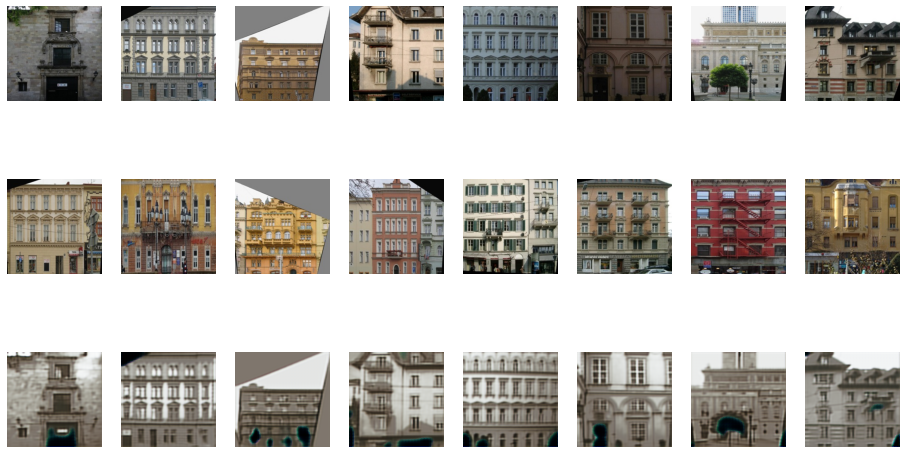

Epoch [2/10] | Time: 69.70824360847473 | G_A:0.4738962948322296 | G_B:0.5329322814941406 | D_A:0.4989748001098633 | D_B:0.4019663333892822


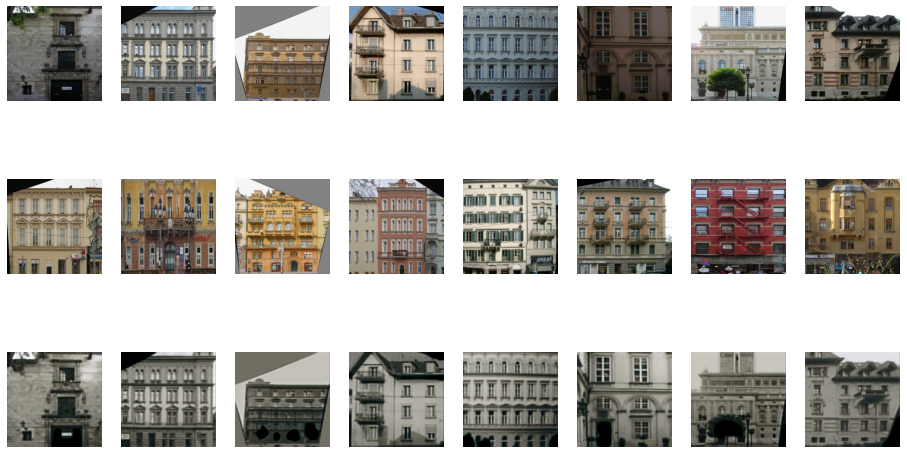

Epoch [3/10] | Time: 70.91674947738647 | G_A:0.20402951538562775 | G_B:0.3407951593399048 | D_A:0.20577789843082428 | D_B:0.2623865008354187


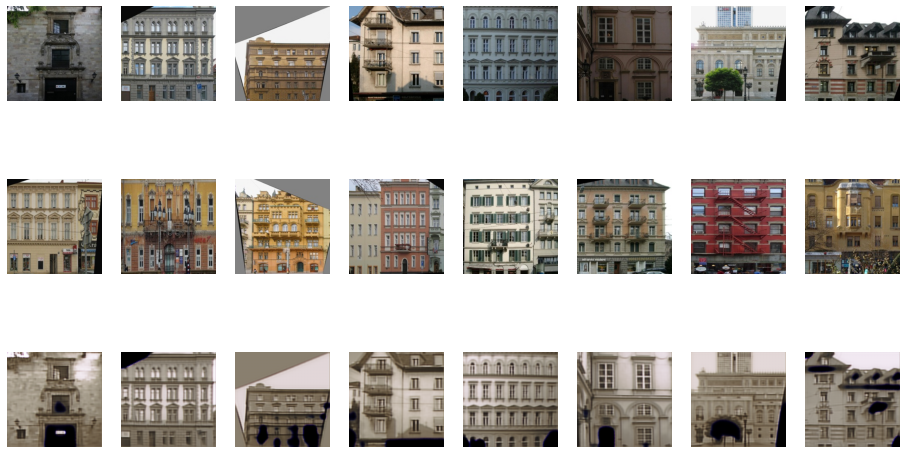

Epoch [4/10] | Time: 69.22735214233398 | G_A:0.35962316393852234 | G_B:0.2848106622695923 | D_A:0.23644164204597473 | D_B:0.275736004114151


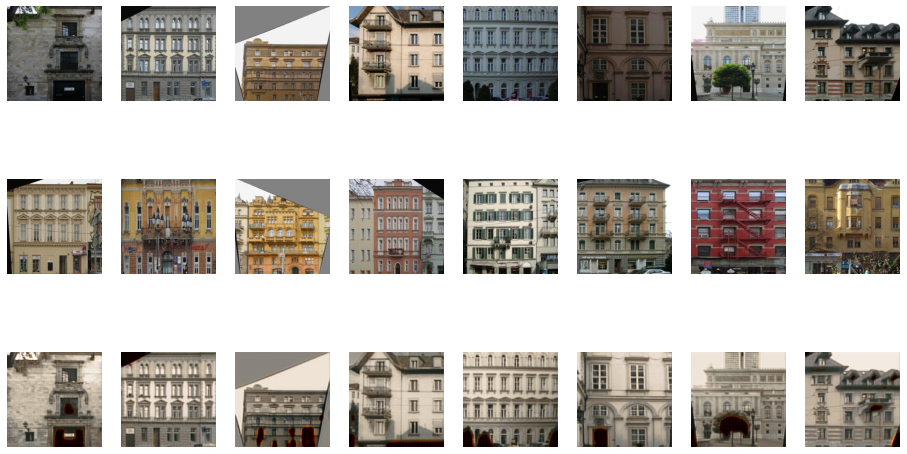

Epoch [5/10] | Time: 70.46570086479187 | G_A:0.3591694235801697 | G_B:0.38736966252326965 | D_A:0.2761119306087494 | D_B:0.30506014823913574


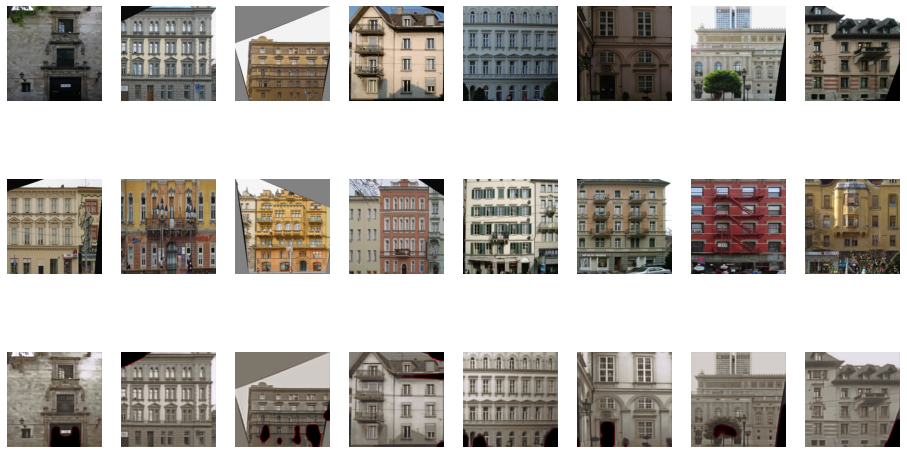

Epoch [6/10] | Time: 71.39313411712646 | G_A:0.21960651874542236 | G_B:0.504638671875 | D_A:0.3431937098503113 | D_B:0.2917402386665344


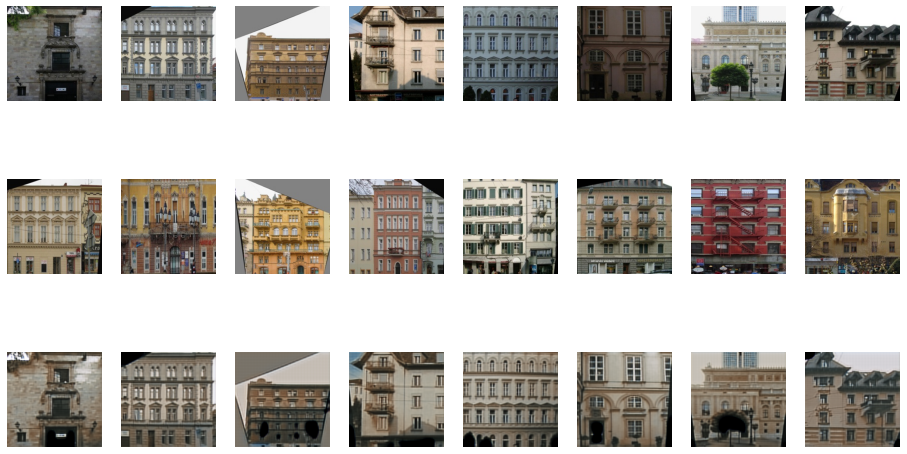

Epoch [7/10] | Time: 68.66734838485718 | G_A:0.16185888648033142 | G_B:0.3563181757926941 | D_A:0.2572717070579529 | D_B:0.22827517986297607


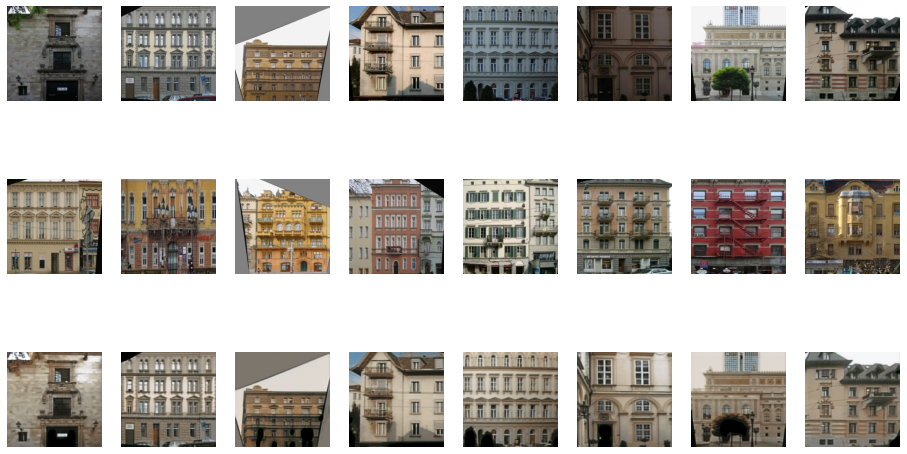

Epoch [8/10] | Time: 70.19446015357971 | G_A:0.25232768058776855 | G_B:0.5084854960441589 | D_A:0.2617560923099518 | D_B:0.3145653307437897


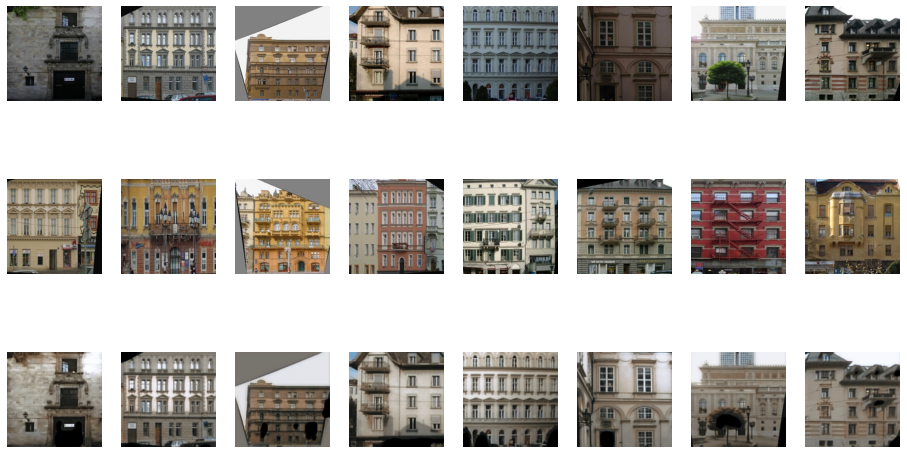

Epoch [9/10] | Time: 70.15309500694275 | G_A:0.5220019817352295 | G_B:0.19463269412517548 | D_A:0.3969132602214813 | D_B:0.2700239419937134


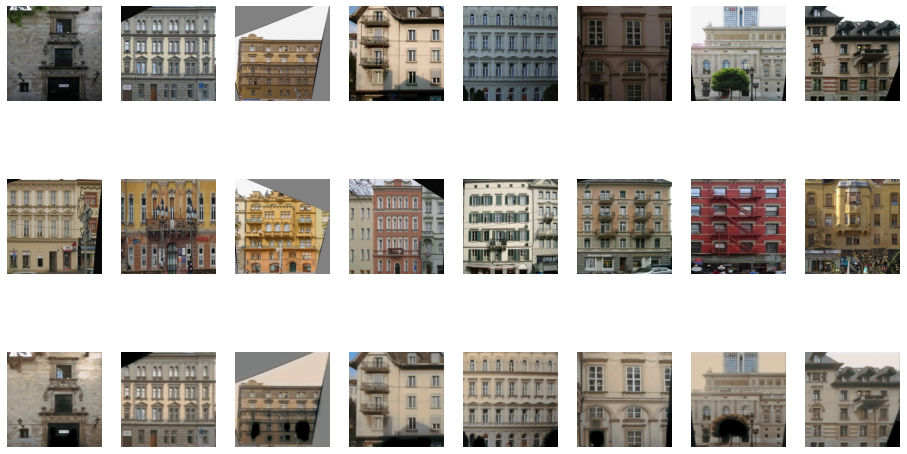

Epoch [10/10] | Time: 69.42777919769287 | G_A:0.42873308062553406 | G_B:0.35843756794929504 | D_A:0.25686824321746826 | D_B:0.28679731488227844


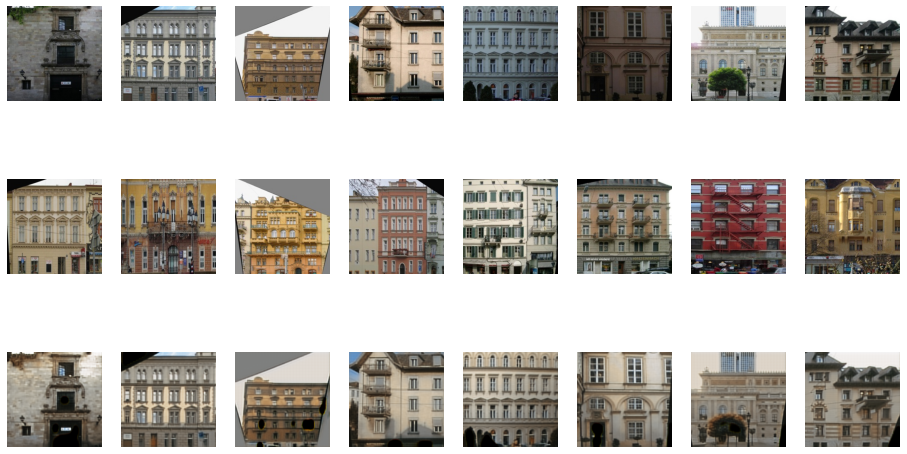

In [130]:
for epoch in range(1, n_epochs + 1):
    epoch_start_time = time.time()
    iter_data_time = time.time()
    epoch_iter = 0      
    model.update_learning_rate()    
    for i, data in enumerate(dataloader_train):
        iter_start_time = time.time()
        total_iters += batch_size
        epoch_iter += batch_size
        model.set_input(data)
        model.optimize_parameters()  

    if epoch % 1 == 0: 
        losses = model.get_current_losses()
        print('Epoch [{0}/{1}] | Time: {2} | G_A:{3} | G_B:{4} | D_A:{5} | D_B:{6}'.format(
            epoch, n_epochs, time.time() - epoch_start_time, losses['G_A'], losses['G_B'], losses['D_A'], losses['D_B']
        ))
        visuals_list = []
        for i, data in enumerate(dataset_val):
            if i > 7:
                break
            model.set_input(data) 
            model.test()      
            visuals = model.get_current_visuals()
            img_path = model.get_image_paths() 
            visuals_list.append(visuals)
        plot_result(visuals_list)
    model.save_networks('latest')